In [2]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import PROJECT.util as f

In [3]:
def mse(x,y):
    return torch.pow((x-y),2).mean(0)

In [4]:
def main_gradient_2_sans_proj_normalisation(iteration, u_p, v_p, Y, u_, v_, N, M, lambda_, beta_u, beta_v, lambda_1, lambda_2, dt):

    res = []
    res_mse= []
    
    mod = iteration*0.1

    for i in range(iteration):

        # Computation
        sqrt_dt = torch.sqrt(dt)

        u_1 = (1/lambda_1) * f.gradient_u_2(N, M, u_p,v_p,Y,lambda_) * dt
        u_2 = torch.sqrt(2/(lambda_1*beta_u)) * torch.empty(N).normal_(mean=0,std=sqrt_dt)
        u_3 = ((N-1)/(N*lambda_1*beta_u))*u_p*dt
        u_n = u_p - u_1 + u_2 - u_3

        v_1 = 1/lambda_2 * f.gradient_v_2(N,M,u_p,v_p,Y,lambda_) * dt
        v_2 = torch.sqrt(2/(lambda_2*beta_v)) * torch.empty(M).normal_(mean=0,std=sqrt_dt)
        v_3 = ((M-1)/(M*lambda_2*beta_v))*v_p*dt
        v_n = v_p - v_1 + v_2 - v_3

        # Normalisation
        u_n = u_n / torch.linalg.norm(u_n)
        v_n = v_n / torch.linalg.norm(v_n)
        u_n = u_n * torch.sqrt(N)
        v_n = v_n * torch.sqrt(M)

        # Re-asign for the loop
        u_p = u_n
        v_p = v_n
    
        res_u = torch.abs(f.overlap(u_,u_n,N))
        res_v = torch.abs(f.overlap(v_,v_n,M))
        res.append((res_u,res_v))
        
        res_mse.append((mse(u_,u_n), mse(v_,v_n)))
        
        if i%mod==0:
            print(f"progress {100*i/iteration:.2f}%", end="\r")
        if i==iteration-1:
            print(f"overlap(u, v): ({res_u}; {res_v})")

    return np.array(res), np.array(res_mse)

In [14]:
def one_run(lambda_=2, N=500, M=500, beta_u=float("inf"), beta_v=float("inf"), lambda_1=1,
        lambda_2=1, dt=1/100, iteration=1000):
      #Size of the matrix Y
    N = torch.tensor(N)
    M = torch.tensor(M)

    # lambda
    lambda_ = torch.tensor(lambda_)

    #temperatures
    beta_u = torch.tensor(beta_u)
    beta_v = torch.tensor(beta_v)

    #learning rates
    lambda_1 = torch.tensor(lambda_1)
    lambda_2 = torch.tensor(lambda_2)

    # Pas de temps
    dt = torch.tensor(dt)

    u_ = f.generate_vector(N)
    v_ = f.generate_vector(M)

    Y = f.generate_Y(N, M, u_,v_, lambda_)
    #print(Y)

    # Conditions initiales
    u_p = f.generate_vector(N)
    v_p = f.generate_vector(M)

    # Perform the gradient descent
    (res, res_mse) = main_gradient_2_sans_proj_normalisation(iteration, u_p, v_p, Y, u_, v_, N, M, lambda_, beta_u, beta_v, lambda_1, lambda_2, dt)
    
    return res, res_mse


In [15]:
# MAIN METHOD:

def main(size_of_one_sample, list_value_, list_value_2):
    
    sample_iterations=[]
    sample_overlap_mean=[]
    
    sample_iterations_mse=[]
    sample_mse_mean=[]
    
    for value_to_test in list_value_:
        
        iterations_for_each_run=[]
        iter_mse=[]
        
        # Calculation
        for _ in range(size_of_one_sample):
            (a,b)=one_run(lambda_=value_to_test, beta_u=list_value_2, beta_v=list_value_2)
            iterations_for_each_run.append(a)
            iter_mse.append(b)
        
        # Calculate mean 
        overlap_mean = np.array([x[-1] for x in iterations_for_each_run])
        mse_mean = np.array([x[-1] for x in iter_mse])
        
        # Store results
        sample_iterations.append(iterations_for_each_run)
        sample_overlap_mean.append(overlap_mean)
        
        sample_iterations_mse.append(iter_mse)
        sample_mse_mean.append(mse_mean)
    return np.array(sample_iterations), np.array(sample_overlap_mean), np.array(sample_iterations_mse), np.array(sample_mse_mean)

In [16]:
# MAIN CELL: DO THE COMPUTATION

list_value_ = np.arange(0.1, 3, 0.1)
#list_value_ = np.array([0.5,0.7,2,1000])

size_of_one_sample=10

list_value2 = np.arange(0.5, 3, 0.1)
res_2vals=[]
for x in list_value2:
    (sample_iterations, sample_overlap_mean, iter_mse, mse_mean) = main(size_of_one_sample, list_value_, x)
    res_2vals.append((sample_iterations, sample_overlap_mean, iter_mse, mse_mean))

overlap(u, v): (0.051262322813272476; 0.1528027057647705)
overlap(u, v): (0.015882262960076332; 0.06301479041576385)
overlap(u, v): (0.015387538820505142; 0.019298935309052467)
overlap(u, v): (0.033014893531799316; 0.03653612360358238)
overlap(u, v): (0.016247279942035675; 0.011748889461159706)
overlap(u, v): (0.06315641105175018; 0.12211836129426956)
overlap(u, v): (0.02082943171262741; 0.024157661944627762)
overlap(u, v): (0.025374269112944603; 0.019986450672149658)
overlap(u, v): (0.0595073327422142; 0.08490690588951111)
overlap(u, v): (0.000997549039311707; 0.04097329080104828)
overlap(u, v): (0.012016205117106438; 0.03385883942246437)
overlap(u, v): (0.03189365193247795; 0.017920158803462982)
overlap(u, v): (0.048316068947315216; 0.052426017820835114)
overlap(u, v): (0.0005051269545219839; 0.012381366454064846)
overlap(u, v): (0.0593428909778595; 0.02245057001709938)
overlap(u, v): (0.025478877127170563; 0.010234132409095764)
overlap(u, v): (0.020049378275871277; 0.053303010761737

overlap(u, v): (0.07394750416278839; 0.00632161321118474)
overlap(u, v): (0.0775618776679039; 0.06381303071975708)
overlap(u, v): (0.05020757392048836; 0.019868260249495506)
overlap(u, v): (0.052715349942445755; 0.06411238014698029)
overlap(u, v): (0.07420580834150314; 0.12598595023155212)
overlap(u, v): (0.0856206864118576; 0.15875034034252167)
overlap(u, v): (0.010156036354601383; 0.045112188905477524)
overlap(u, v): (0.0119598638266325; 0.028876369819045067)
overlap(u, v): (0.06821315735578537; 0.06481485813856125)
overlap(u, v): (0.07627947628498077; 0.1045360416173935)
overlap(u, v): (0.045236267149448395; 0.013283389620482922)
overlap(u, v): (0.0674300268292427; 0.010578430257737637)
overlap(u, v): (0.1335470974445343; 0.09942272305488586)
overlap(u, v): (0.042582083493471146; 0.054385941475629807)
overlap(u, v): (0.0060879229567945; 0.019885288551449776)
overlap(u, v): (0.13570398092269897; 0.08310577273368835)
overlap(u, v): (0.017625974491238594; 0.04900297895073891)
overlap(u

overlap(u, v): (0.487851083278656; 0.4997347891330719)
overlap(u, v): (0.40118318796157837; 0.3839607536792755)
overlap(u, v): (0.3894273042678833; 0.3435959219932556)
overlap(u, v): (0.4423450827598572; 0.43813955783843994)
overlap(u, v): (0.20546065270900726; 0.18252474069595337)
overlap(u, v): (0.4276302456855774; 0.4416179060935974)
overlap(u, v): (0.4750764071941376; 0.44203904271125793)
overlap(u, v): (0.40976423025131226; 0.437037855386734)
overlap(u, v): (0.47679150104522705; 0.44822803139686584)
overlap(u, v): (0.07589074969291687; 0.10588749498128891)
overlap(u, v): (0.008778595365583897; 0.015157818794250488)
overlap(u, v): (0.010202500969171524; 0.00675180833786726)
overlap(u, v): (0.03746208921074867; 0.0667416900396347)
overlap(u, v): (0.03910566866397858; 0.06420701742172241)
overlap(u, v): (0.027613474056124687; 0.023934481665492058)
overlap(u, v): (0.011961838230490685; 0.00666304025799036)
overlap(u, v): (0.023066498339176178; 0.09005792438983917)
overlap(u, v): (0.01

overlap(u, v): (0.0013390026288107038; 0.00914792250841856)
overlap(u, v): (0.05485919490456581; 0.07605502009391785)
overlap(u, v): (0.04309806227684021; 0.10850074887275696)
overlap(u, v): (0.02663828246295452; 0.06383650004863739)
overlap(u, v): (0.009579095989465714; 0.04461381211876869)
overlap(u, v): (0.04102735593914986; 0.031610261648893356)
overlap(u, v): (0.010330591350793839; 0.03252124786376953)
overlap(u, v): (0.05653238669037819; 0.08631645143032074)
overlap(u, v): (0.05861992388963699; 0.13013461232185364)
overlap(u, v): (0.1250540018081665; 0.17311809957027435)
overlap(u, v): (0.09201490879058838; 0.006835426203906536)
overlap(u, v): (0.08766839653253555; 0.10876300185918808)
overlap(u, v): (0.02501007914543152; 0.06649674475193024)
overlap(u, v): (0.02976188249886036; 0.006941559724509716)
overlap(u, v): (0.03782949224114418; 0.019408905878663063)
overlap(u, v): (0.060514792799949646; 0.05228723585605621)
overlap(u, v): (0.07181737571954727; 0.04104512929916382)
overla

overlap(u, v): (0.5005478858947754; 0.48420101404190063)
overlap(u, v): (0.4444476366043091; 0.42042145133018494)
overlap(u, v): (0.4737532436847687; 0.448544442653656)
overlap(u, v): (0.4569646120071411; 0.5061872601509094)
overlap(u, v): (0.5227769613265991; 0.5389606952667236)
overlap(u, v): (0.5260626077651978; 0.5408652424812317)
overlap(u, v): (0.4847809374332428; 0.46814489364624023)
overlap(u, v): (0.4977290630340576; 0.5027665495872498)
overlap(u, v): (0.5341604948043823; 0.538501501083374)
overlap(u, v): (0.5725224018096924; 0.5984626412391663)
overlap(u, v): (0.48223888874053955; 0.45729729533195496)
overlap(u, v): (0.5220213532447815; 0.5173925757408142)
overlap(u, v): (0.5112121105194092; 0.527309238910675)
overlap(u, v): (0.5388914942741394; 0.5534518957138062)
overlap(u, v): (0.5594097971916199; 0.4707780182361603)
overlap(u, v): (0.4889279007911682; 0.5233815908432007)
overlap(u, v): (0.0038258933927863836; 0.11712042987346649)
overlap(u, v): (0.0349857434630394; 0.0816

overlap(u, v): (0.053427740931510925; 0.038644928485155106)
overlap(u, v): (0.029607193544507027; 0.07061532139778137)
overlap(u, v): (0.0009589752880856395; 0.0771799311041832)
overlap(u, v): (0.11221379041671753; 0.08082092553377151)
overlap(u, v): (0.03289083018898964; 0.016286689788103104)
overlap(u, v): (0.09431027621030807; 0.04632720723748207)
overlap(u, v): (0.03766108676791191; 0.0923418253660202)
overlap(u, v): (0.056454725563526154; 0.02225666120648384)
overlap(u, v): (0.005696834530681372; 0.0137114142999053)
overlap(u, v): (0.28357091546058655; 0.23931311070919037)
overlap(u, v): (0.13182443380355835; 0.11434832960367203)
overlap(u, v): (0.15452273190021515; 0.17335636913776398)
overlap(u, v): (0.1889369636774063; 0.14773672819137573)
overlap(u, v): (0.0349397212266922; 0.024660877883434296)
overlap(u, v): (0.09301061928272247; 0.09925048798322678)
overlap(u, v): (0.11259297281503677; 0.14796151220798492)
overlap(u, v): (0.24892817437648773; 0.2193259596824646)
overlap(u, 

overlap(u, v): (0.5632062554359436; 0.5791382789611816)
overlap(u, v): (0.5369203686714172; 0.5631729364395142)
overlap(u, v): (0.49351629614830017; 0.4967889189720154)
overlap(u, v): (0.5623456835746765; 0.5579671263694763)
overlap(u, v): (0.5229268670082092; 0.5172611474990845)
overlap(u, v): (0.5539653301239014; 0.5552499890327454)
overlap(u, v): (0.35759663581848145; 0.4351096451282501)
overlap(u, v): (0.5410467982292175; 0.5332807302474976)
overlap(u, v): (0.5578503012657166; 0.6140368580818176)
overlap(u, v): (0.5515892505645752; 0.5234867930412292)
overlap(u, v): (0.563252866268158; 0.5684452056884766)
overlap(u, v): (0.5242040157318115; 0.52414470911026)
overlap(u, v): (0.5087379217147827; 0.48169195652008057)
overlap(u, v): (0.54205721616745; 0.5598951578140259)
overlap(u, v): (0.5449907183647156; 0.524986982345581)
overlap(u, v): (0.541067898273468; 0.523112416267395)
overlap(u, v): (0.579120397567749; 0.5990475416183472)
overlap(u, v): (0.5669302940368652; 0.5672262907028198

overlap(u, v): (0.013526137918233871; 0.011034013703465462)
overlap(u, v): (0.09213092923164368; 0.08487527817487717)
overlap(u, v): (0.08867404609918594; 0.09222692251205444)
overlap(u, v): (0.057385582476854324; 0.08222267776727676)
overlap(u, v): (0.10316434502601624; 0.055006109178066254)
overlap(u, v): (0.014714470133185387; 0.033987294882535934)
overlap(u, v): (0.16669166088104248; 0.11749657243490219)
overlap(u, v): (0.13670361042022705; 0.17027077078819275)
overlap(u, v): (0.1037239134311676; 0.060524046421051025)
overlap(u, v): (0.09469252079725266; 0.05814584344625473)
overlap(u, v): (0.12014645338058472; 0.1297125518321991)
overlap(u, v): (0.0010131272720173001; 0.020524518564343452)
overlap(u, v): (0.014565101824700832; 0.009865990839898586)
overlap(u, v): (0.11754681169986725; 0.15635989606380463)
overlap(u, v): (0.18751825392246246; 0.1922225058078766)
overlap(u, v): (0.08480532467365265; 0.05085649713873863)
overlap(u, v): (0.003986688796430826; 0.009126592427492142)
ove

overlap(u, v): (0.5406920909881592; 0.5735573768615723)
overlap(u, v): (0.5641893148422241; 0.5925862789154053)
overlap(u, v): (0.5106404423713684; 0.5148038268089294)
overlap(u, v): (0.6212457418441772; 0.578221321105957)
overlap(u, v): (0.5882762670516968; 0.5761908888816833)
overlap(u, v): (0.5388263463973999; 0.5636797547340393)
overlap(u, v): (0.5195236802101135; 0.5556378364562988)
overlap(u, v): (0.5286730527877808; 0.5271745324134827)
overlap(u, v): (0.5915794968605042; 0.5908355116844177)
overlap(u, v): (0.6292133331298828; 0.5717059373855591)
overlap(u, v): (0.563123881816864; 0.5608523488044739)
overlap(u, v): (0.6114025712013245; 0.6292905211448669)
overlap(u, v): (0.6133947968482971; 0.5604547262191772)
overlap(u, v): (0.4573913812637329; 0.46640053391456604)
overlap(u, v): (0.6064706444740295; 0.589214026927948)
overlap(u, v): (0.5607441663742065; 0.5496665239334106)
overlap(u, v): (0.538127064704895; 0.5517051219940186)
overlap(u, v): (0.5872843265533447; 0.5277974605560

overlap(u, v): (0.04492265358567238; 0.008870519697666168)
overlap(u, v): (0.028624312952160835; 0.07721308618783951)
overlap(u, v): (0.1362844705581665; 0.10783883184194565)
overlap(u, v): (0.14439281821250916; 0.09149926155805588)
overlap(u, v): (0.02718208357691765; 0.04075716435909271)
overlap(u, v): (0.05431994050741196; 0.03776963800191879)
overlap(u, v): (0.04026836156845093; 0.020981326699256897)
overlap(u, v): (0.0422220341861248; 0.08293475955724716)
overlap(u, v): (0.14616525173187256; 0.12707389891147614)
overlap(u, v): (0.2490134835243225; 0.1766742616891861)
overlap(u, v): (0.19493535161018372; 0.16154025495052338)
overlap(u, v): (0.19806548953056335; 0.13829319179058075)
overlap(u, v): (0.2209397852420807; 0.21715067327022552)
overlap(u, v): (0.0019240893889218569; 0.012752792797982693)
overlap(u, v): (0.016842974349856377; 0.009164680726826191)
overlap(u, v): (0.15952682495117188; 0.17841853201389313)
overlap(u, v): (0.12148749083280563; 0.11498495191335678)
overlap(u, 

overlap(u, v): (0.6162009239196777; 0.5333386063575745)
overlap(u, v): (0.5200011134147644; 0.5838921070098877)
overlap(u, v): (0.5757632851600647; 0.6138047575950623)
overlap(u, v): (0.5030005574226379; 0.5220990180969238)
overlap(u, v): (0.5787601470947266; 0.6043266654014587)
overlap(u, v): (0.6075263619422913; 0.5910236239433289)
overlap(u, v): (0.6038730144500732; 0.591700553894043)
overlap(u, v): (0.6086419820785522; 0.6777055263519287)
overlap(u, v): (0.57156902551651; 0.608790934085846)
overlap(u, v): (0.6129013895988464; 0.6414416432380676)
overlap(u, v): (0.590900719165802; 0.6046923995018005)
overlap(u, v): (0.5375975370407104; 0.5235207676887512)
overlap(u, v): (0.4774564802646637; 0.49010878801345825)
overlap(u, v): (0.6112263202667236; 0.6595122218132019)
overlap(u, v): (0.6238935589790344; 0.6314187049865723)
overlap(u, v): (0.6546062231063843; 0.6118476986885071)
overlap(u, v): (0.5643229484558105; 0.5509941577911377)
overlap(u, v): (0.6395133137702942; 0.64900010824203

overlap(u, v): (0.20816822350025177; 0.1424090415239334)
overlap(u, v): (0.15437322854995728; 0.19394198060035706)
overlap(u, v): (0.10336671769618988; 0.11542390286922455)
overlap(u, v): (0.13393783569335938; 0.10534768551588058)
overlap(u, v): (0.09023945033550262; 0.13703207671642303)
overlap(u, v): (0.12690424919128418; 0.1309298425912857)
overlap(u, v): (0.1925266534090042; 0.14979764819145203)
overlap(u, v): (0.2566086947917938; 0.1866973340511322)
overlap(u, v): (0.08927194029092789; 0.061275191605091095)
overlap(u, v): (0.11378517001867294; 0.12437006086111069)
overlap(u, v): (0.11855839192867279; 0.10539492964744568)
overlap(u, v): (0.055314138531684875; 0.0356721505522728)
overlap(u, v): (0.17433398962020874; 0.11454436928033829)
overlap(u, v): (0.02620260789990425; 0.0061615752056241035)
overlap(u, v): (0.017360378056764603; 0.07233110070228577)
overlap(u, v): (0.04899701103568077; 0.020197918638586998)
overlap(u, v): (0.027276206761598587; 0.03029930405318737)
overlap(u, v)

overlap(u, v): (0.5737382769584656; 0.5975251197814941)
overlap(u, v): (0.6027755737304688; 0.6113088130950928)
overlap(u, v): (0.6084825396537781; 0.5766364932060242)
overlap(u, v): (0.6775168180465698; 0.640972912311554)
overlap(u, v): (0.6408112049102783; 0.6229779124259949)
overlap(u, v): (0.6272172331809998; 0.5904703140258789)
overlap(u, v): (0.6264815926551819; 0.5720841884613037)
overlap(u, v): (0.6108254194259644; 0.5984882712364197)
overlap(u, v): (0.6608694791793823; 0.6398732662200928)
overlap(u, v): (0.6310240030288696; 0.5996178388595581)
overlap(u, v): (0.6060922145843506; 0.6034322381019592)
overlap(u, v): (0.6512460708618164; 0.620388925075531)
overlap(u, v): (0.6245495676994324; 0.6312940120697021)
overlap(u, v): (0.6103519797325134; 0.6081622242927551)
overlap(u, v): (0.5969157814979553; 0.6295958757400513)
overlap(u, v): (0.6195632219314575; 0.6008684039115906)
overlap(u, v): (0.6023684740066528; 0.6130335330963135)
overlap(u, v): (0.6031671166419983; 0.634364128112

overlap(u, v): (0.22220557928085327; 0.20407941937446594)
overlap(u, v): (0.12197315692901611; 0.09675274789333344)
overlap(u, v): (0.061348844319581985; 0.009111753664910793)
overlap(u, v): (0.1564909666776657; 0.21786557137966156)
overlap(u, v): (0.015116565860807896; 0.09725496172904968)
overlap(u, v): (0.16023284196853638; 0.06481803953647614)
overlap(u, v): (0.18470339477062225; 0.17279112339019775)
overlap(u, v): (0.0004016008460894227; 0.023394593968987465)
overlap(u, v): (0.11961165070533752; 0.16263149678707123)
overlap(u, v): (0.24646295607089996; 0.23631490767002106)
overlap(u, v): (0.10121942311525345; 0.03508973494172096)
overlap(u, v): (0.07438352704048157; 0.057379670441150665)
overlap(u, v): (0.22197693586349487; 0.17550091445446014)
overlap(u, v): (0.016481025144457817; 0.03258663788437843)
overlap(u, v): (0.14718514680862427; 0.12764616310596466)
overlap(u, v): (0.1335192620754242; 0.0812869593501091)
overlap(u, v): (0.2124941349029541; 0.10505539178848267)
overlap(u,

overlap(u, v): (0.616053581237793; 0.6201475262641907)
overlap(u, v): (0.5716854333877563; 0.5780168175697327)
overlap(u, v): (0.29744160175323486; 0.31503042578697205)
overlap(u, v): (0.0912553146481514; 0.08811769634485245)
overlap(u, v): (0.6014726758003235; 0.602617084980011)
overlap(u, v): (0.6214661002159119; 0.6288696527481079)
overlap(u, v): (0.5973607897758484; 0.5496232509613037)
overlap(u, v): (0.6191426515579224; 0.6271969676017761)
overlap(u, v): (0.6402225494384766; 0.6191057562828064)
overlap(u, v): (0.543542742729187; 0.5490965843200684)
overlap(u, v): (0.5842597484588623; 0.5832458734512329)
overlap(u, v): (0.6336794495582581; 0.6204410195350647)
overlap(u, v): (0.6367377638816833; 0.560124397277832)
overlap(u, v): (0.6357924938201904; 0.6384270787239075)
overlap(u, v): (0.6532005071640015; 0.6428009271621704)
overlap(u, v): (0.6062772274017334; 0.6107445955276489)
overlap(u, v): (0.6320262551307678; 0.6173126101493835)
overlap(u, v): (0.6225028038024902; 0.61518418788

overlap(u, v): (0.09473583847284317; 0.047791145741939545)
overlap(u, v): (0.02371971309185028; 0.005214466247707605)
overlap(u, v): (0.07911120355129242; 0.008071147836744785)
overlap(u, v): (0.07461041212081909; 0.009826472960412502)
overlap(u, v): (0.1292266994714737; 0.14867600798606873)
overlap(u, v): (0.22208108007907867; 0.17447824776172638)
overlap(u, v): (0.031095558777451515; 0.05114703252911568)
overlap(u, v): (0.1781512349843979; 0.12246964871883392)
overlap(u, v): (0.14122818410396576; 0.2234410047531128)
overlap(u, v): (0.006968759465962648; 0.001216793549247086)
overlap(u, v): (0.2347681224346161; 0.25008779764175415)
overlap(u, v): (0.12157521396875381; 0.15706825256347656)
overlap(u, v): (0.11302680522203445; 0.0662875548005104)
overlap(u, v): (0.12380819767713547; 0.129408597946167)
overlap(u, v): (0.09963510930538177; 0.07312346994876862)
overlap(u, v): (0.029246952384710312; 0.007306236308068037)
overlap(u, v): (0.2042284607887268; 0.22284048795700073)
overlap(u, v)

overlap(u, v): (0.6253262758255005; 0.67625892162323)
overlap(u, v): (0.6292105913162231; 0.6190280914306641)
overlap(u, v): (0.5965959429740906; 0.5685361623764038)
overlap(u, v): (0.6739971041679382; 0.6651214361190796)
overlap(u, v): (0.6308121085166931; 0.6288542151451111)
overlap(u, v): (0.6601287722587585; 0.6510335206985474)
overlap(u, v): (0.6412016749382019; 0.6114206910133362)
overlap(u, v): (0.663752019405365; 0.6911100149154663)
overlap(u, v): (0.5664138197898865; 0.5536290407180786)
overlap(u, v): (0.6514290571212769; 0.621380627155304)
overlap(u, v): (0.6366747617721558; 0.6239240169525146)
overlap(u, v): (0.6575739979743958; 0.6662120819091797)
overlap(u, v): (0.6584544777870178; 0.6503105759620667)
overlap(u, v): (0.6444752216339111; 0.5648749470710754)
overlap(u, v): (0.5680968165397644; 0.611210286617279)
overlap(u, v): (0.6458708047866821; 0.6532369256019592)
overlap(u, v): (0.6569509506225586; 0.6490517854690552)
overlap(u, v): (0.6429322361946106; 0.620798945426940

overlap(u, v): (0.01078394241631031; 0.0694674700498581)
overlap(u, v): (0.09824910759925842; 0.07451742142438889)
overlap(u, v): (0.0787460058927536; 0.07201153039932251)
overlap(u, v): (0.09390047937631607; 0.1307792067527771)
overlap(u, v): (0.05596514791250229; 0.1093633845448494)
overlap(u, v): (0.030914166942238808; 0.03727652132511139)
overlap(u, v): (0.20800350606441498; 0.1913706660270691)
overlap(u, v): (0.002563940128311515; 0.0474487729370594)
overlap(u, v): (0.08574513345956802; 0.101478710770607)
overlap(u, v): (0.09751417487859726; 0.07997899502515793)
overlap(u, v): (0.010760175995528698; 0.024835430085659027)
overlap(u, v): (0.0513359010219574; 0.013432268984615803)
overlap(u, v): (0.2108861356973648; 0.21332423388957977)
overlap(u, v): (0.035530198365449905; 0.011984127573668957)
overlap(u, v): (0.08936784416437149; 0.12135530263185501)
overlap(u, v): (0.06848219782114029; 0.0369039885699749)
overlap(u, v): (0.17447759211063385; 0.16453024744987488)
overlap(u, v): (0.

overlap(u, v): (0.44753357768058777; 0.443337619304657)
overlap(u, v): (0.6381494998931885; 0.6348191499710083)
overlap(u, v): (0.6581950783729553; 0.6729646921157837)
overlap(u, v): (0.5576381683349609; 0.5319960117340088)
overlap(u, v): (0.6254464387893677; 0.6520782113075256)
overlap(u, v): (0.6841212511062622; 0.696226179599762)
overlap(u, v): (0.6408067941665649; 0.5993536710739136)
overlap(u, v): (0.6781150102615356; 0.7042385935783386)
overlap(u, v): (0.5711058378219604; 0.5426027774810791)
overlap(u, v): (0.6171167492866516; 0.6501857042312622)
overlap(u, v): (0.6141811609268188; 0.6205379962921143)
overlap(u, v): (0.6842862367630005; 0.6900535821914673)
overlap(u, v): (0.6528245210647583; 0.5781818628311157)
overlap(u, v): (0.6683790683746338; 0.6471423506736755)
overlap(u, v): (0.6551252007484436; 0.6476951241493225)
overlap(u, v): (0.6867159605026245; 0.6994762420654297)
overlap(u, v): (0.6512978076934814; 0.6541824340820312)
overlap(u, v): (0.6585865616798401; 0.64392668008

overlap(u, v): (0.017344893887639046; 0.02211468480527401)
overlap(u, v): (0.15269619226455688; 0.15600717067718506)
overlap(u, v): (0.007411319762468338; 0.08119653165340424)
overlap(u, v): (0.06296837329864502; 0.057128436863422394)
overlap(u, v): (0.038059353828430176; 0.05645274370908737)
overlap(u, v): (0.027678316459059715; 0.040415868163108826)
overlap(u, v): (0.22074386477470398; 0.22434231638908386)
overlap(u, v): (0.07410954684019089; 0.035298071801662445)
overlap(u, v): (0.047733601182699203; 0.04369349405169487)
overlap(u, v): (0.3592899739742279; 0.33111268281936646)
overlap(u, v): (0.1279141902923584; 0.08262749761343002)
overlap(u, v): (0.027193443849682808; 0.1253979355096817)
overlap(u, v): (0.1937769502401352; 0.15188001096248627)
overlap(u, v): (0.04212410748004913; 0.05172504484653473)
overlap(u, v): (0.06712489575147629; 0.0631798505783081)
overlap(u, v): (0.14441968500614166; 0.12393514811992645)
overlap(u, v): (0.10929971933364868; 0.13048957288265228)
overlap(u,

overlap(u, v): (0.6360458731651306; 0.6124463081359863)
overlap(u, v): (0.6389517784118652; 0.5845819711685181)
overlap(u, v): (0.644530177116394; 0.6403816938400269)
overlap(u, v): (0.6530643701553345; 0.6904217004776001)
overlap(u, v): (0.24185386300086975; 0.23549431562423706)
overlap(u, v): (0.6520149111747742; 0.6459833979606628)
overlap(u, v): (0.6484772562980652; 0.6690399050712585)
overlap(u, v): (0.6201767325401306; 0.6198335886001587)
overlap(u, v): (0.6739022731781006; 0.6850738525390625)
overlap(u, v): (0.6660774946212769; 0.685444712638855)
overlap(u, v): (0.6678908467292786; 0.643900454044342)
overlap(u, v): (0.6561236381530762; 0.6805691123008728)
overlap(u, v): (0.3977854549884796; 0.3945187032222748)
overlap(u, v): (0.07370848953723907; 0.07202275842428207)
overlap(u, v): (0.6532123684883118; 0.6505796313285828)
overlap(u, v): (0.64971923828125; 0.6866236925125122)
overlap(u, v): (0.573304295539856; 0.5989933013916016)
overlap(u, v): (0.6352841258049011; 0.648593544960

overlap(u, v): (0.034758903086185455; 0.10216328501701355)
overlap(u, v): (0.060413964092731476; 0.06724812835454941)
overlap(u, v): (0.07905452698469162; 0.08117132633924484)
overlap(u, v): (0.0897117406129837; 0.05053744465112686)
overlap(u, v): (0.05868127569556236; 0.06988431513309479)
overlap(u, v): (0.11859133839607239; 0.08083270490169525)
overlap(u, v): (0.13065162301063538; 0.15595470368862152)
overlap(u, v): (0.07822143286466599; 0.13189837336540222)
overlap(u, v): (0.13098770380020142; 0.14797106385231018)
overlap(u, v): (0.20353972911834717; 0.18538223206996918)
overlap(u, v): (0.05109170451760292; 0.0010887222597375512)
overlap(u, v): (0.21406793594360352; 0.1552887111902237)
overlap(u, v): (0.012621697969734669; 0.03960749879479408)
overlap(u, v): (0.11605845391750336; 0.19970031082630157)
overlap(u, v): (0.2624760866165161; 0.23622271418571472)
overlap(u, v): (0.1985471248626709; 0.18368598818778992)
overlap(u, v): (0.07532109320163727; 0.11540084332227707)
overlap(u, v)

overlap(u, v): (0.6237098574638367; 0.6198152899742126)
overlap(u, v): (0.6442841291427612; 0.6601144075393677)
overlap(u, v): (0.6262696385383606; 0.646776020526886)
overlap(u, v): (0.6322501301765442; 0.6677696704864502)
overlap(u, v): (0.6436351537704468; 0.6486159563064575)
overlap(u, v): (0.6565614938735962; 0.6339520215988159)
overlap(u, v): (0.665841817855835; 0.6464383602142334)
overlap(u, v): (0.6512647867202759; 0.6318899989128113)
overlap(u, v): (0.6296848058700562; 0.6505573391914368)
overlap(u, v): (0.5982292294502258; 0.6276813745498657)
overlap(u, v): (0.6602446436882019; 0.6738045811653137)
overlap(u, v): (0.6830564141273499; 0.6516684293746948)
overlap(u, v): (0.6104116439819336; 0.6065284609794617)
overlap(u, v): (0.6635441780090332; 0.670215904712677)
overlap(u, v): (0.6362967491149902; 0.6840946078300476)
overlap(u, v): (0.7066826224327087; 0.6770472526550293)
overlap(u, v): (0.4291306436061859; 0.43251270055770874)
overlap(u, v): (0.6247518062591553; 0.618988871574

overlap(u, v): (0.2553454637527466; 0.20094715058803558)
overlap(u, v): (0.03370022401213646; 0.05604133382439613)
overlap(u, v): (0.09810598194599152; 0.06952381134033203)
overlap(u, v): (0.07131457328796387; 0.10104289650917053)
overlap(u, v): (0.05491166189312935; 0.09725477546453476)
overlap(u, v): (0.09819336235523224; 0.09457294642925262)
overlap(u, v): (0.16616006195545197; 0.10838665813207626)
overlap(u, v): (0.15757419168949127; 0.08426562696695328)
overlap(u, v): (0.19886992871761322; 0.2567196488380432)
overlap(u, v): (0.06113344803452492; 0.1089702919125557)
overlap(u, v): (0.021621419116854668; 0.04557856172323227)
overlap(u, v): (0.07339686155319214; 0.06094194948673248)
overlap(u, v): (0.06947821378707886; 0.07314885407686234)
overlap(u, v): (0.09440832585096359; 0.07401759177446365)
overlap(u, v): (0.22973981499671936; 0.3078601658344269)
overlap(u, v): (0.003197017591446638; 0.05738957226276398)
overlap(u, v): (0.10244683921337128; 0.09678205847740173)
overlap(u, v): (

overlap(u, v): (0.49359363317489624; 0.48043006658554077)
overlap(u, v): (0.6475636959075928; 0.6259335875511169)
overlap(u, v): (0.6697957515716553; 0.6308008432388306)
overlap(u, v): (0.6637476682662964; 0.6770649552345276)
overlap(u, v): (0.632949709892273; 0.677706778049469)
overlap(u, v): (0.4891262352466583; 0.48236387968063354)
overlap(u, v): (0.6455339789390564; 0.6385135054588318)
overlap(u, v): (0.6721593737602234; 0.6640299558639526)
overlap(u, v): (0.4908770024776459; 0.5089293718338013)
overlap(u, v): (0.6699881553649902; 0.6534635424613953)
overlap(u, v): (0.5729042291641235; 0.5680261254310608)
overlap(u, v): (0.10463573038578033; 0.11098748445510864)
overlap(u, v): (0.6484435796737671; 0.6453198790550232)
overlap(u, v): (0.6991049647331238; 0.6778843998908997)
overlap(u, v): (0.6374809741973877; 0.6549916863441467)
overlap(u, v): (0.6705145835876465; 0.6718580722808838)
overlap(u, v): (0.6401534080505371; 0.6600868105888367)
overlap(u, v): (0.6948150396347046; 0.6972357

overlap(u, v): (0.033000726252794266; 0.04859539121389389)
overlap(u, v): (0.02746492251753807; 0.06129259243607521)
overlap(u, v): (0.19647450745105743; 0.18369975686073303)
overlap(u, v): (0.03632582724094391; 0.014396445825695992)
overlap(u, v): (0.05943874642252922; 0.01275352481752634)
overlap(u, v): (0.07027149945497513; 0.0886492133140564)
overlap(u, v): (0.08498072624206543; 0.1062750443816185)
overlap(u, v): (0.14842194318771362; 0.144659623503685)
overlap(u, v): (0.15187160670757294; 0.1345359981060028)
overlap(u, v): (0.03663939610123634; 0.012909936718642712)
overlap(u, v): (0.11519871652126312; 0.14625124633312225)
overlap(u, v): (0.22355948388576508; 0.23348529636859894)
overlap(u, v): (0.14369794726371765; 0.14862892031669617)
overlap(u, v): (0.15875601768493652; 0.15633240342140198)
overlap(u, v): (0.14909176528453827; 0.10895789414644241)
overlap(u, v): (0.02783152274787426; 0.06309568136930466)
overlap(u, v): (0.2887841761112213; 0.2797833979129791)
overlap(u, v): (0.

overlap(u, v): (0.6019238233566284; 0.6294582486152649)
overlap(u, v): (0.5975947976112366; 0.5737651586532593)
overlap(u, v): (0.5826482176780701; 0.5790212154388428)
overlap(u, v): (0.6329360604286194; 0.6524415016174316)
overlap(u, v): (0.6300274729728699; 0.6095055937767029)
overlap(u, v): (0.6171662211418152; 0.607257068157196)
overlap(u, v): (0.5994789004325867; 0.5993941426277161)
overlap(u, v): (0.7194355726242065; 0.7195246815681458)
overlap(u, v): (0.5985695719718933; 0.594984769821167)
overlap(u, v): (0.39213642477989197; 0.4153788983821869)
overlap(u, v): (0.6596422791481018; 0.6734055280685425)
overlap(u, v): (0.6413842439651489; 0.6505738496780396)
overlap(u, v): (0.61651611328125; 0.617235004901886)
overlap(u, v): (0.6592867374420166; 0.7070383429527283)
overlap(u, v): (0.7164799571037292; 0.7171385288238525)
overlap(u, v): (0.6623282432556152; 0.6743167638778687)
overlap(u, v): (0.5028053522109985; 0.42816102504730225)
overlap(u, v): (0.6491894721984863; 0.6415262222290

overlap(u, v): (0.00435612490400672; 0.0844203308224678)
overlap(u, v): (0.09800197184085846; 0.01882137730717659)
overlap(u, v): (0.08361071348190308; 0.055406518280506134)
overlap(u, v): (0.1711275726556778; 0.1954139620065689)
overlap(u, v): (0.10769283771514893; 0.05113090202212334)
overlap(u, v): (0.027066009119153023; 0.006763712037354708)
overlap(u, v): (0.2382935732603073; 0.28712403774261475)
overlap(u, v): (0.09811024367809296; 0.12725600600242615)
overlap(u, v): (0.11946243792772293; 0.07081824541091919)
overlap(u, v): (0.03781268745660782; 0.06534271687269211)
overlap(u, v): (0.12090791761875153; 0.07879771292209625)
overlap(u, v): (0.004143158905208111; 0.043942876160144806)
overlap(u, v): (0.017557663843035698; 0.06553356349468231)
overlap(u, v): (0.14892801642417908; 0.13743902742862701)
overlap(u, v): (0.1114143580198288; 0.06187940016388893)
overlap(u, v): (0.08428362756967545; 0.12101050466299057)
overlap(u, v): (0.0949166864156723; 0.08609768748283386)
overlap(u, v):

overlap(u, v): (0.6473236083984375; 0.6476001143455505)
overlap(u, v): (0.6589130163192749; 0.68174147605896)
overlap(u, v): (0.6477718353271484; 0.5900835990905762)
overlap(u, v): (0.6899721026420593; 0.6929895281791687)
overlap(u, v): (0.6665196418762207; 0.6601939797401428)
overlap(u, v): (0.6795302629470825; 0.6813406944274902)
overlap(u, v): (0.6389163732528687; 0.655680239200592)
overlap(u, v): (0.5609973073005676; 0.5749593377113342)
overlap(u, v): (0.6540550589561462; 0.62727952003479)
overlap(u, v): (0.583992063999176; 0.6202694177627563)
overlap(u, v): (0.6641010642051697; 0.6458152532577515)
overlap(u, v): (0.6167721152305603; 0.6690009832382202)
overlap(u, v): (0.6730402708053589; 0.662994921207428)
overlap(u, v): (0.6844538450241089; 0.6868217587471008)
overlap(u, v): (0.6349069476127625; 0.6581201553344727)
overlap(u, v): (0.6626876592636108; 0.6709921956062317)
overlap(u, v): (0.6956884264945984; 0.6843265295028687)
overlap(u, v): (0.6455066204071045; 0.6495080590248108)

overlap(u, v): (0.008632984943687916; 0.07646641880273819)
overlap(u, v): (0.1252061426639557; 0.08076072484254837)
overlap(u, v): (0.0693858191370964; 0.05734569579362869)
overlap(u, v): (0.034280143678188324; 0.04440286383032799)
overlap(u, v): (0.02276485599577427; 0.008398029021918774)
overlap(u, v): (0.044224318116903305; 0.07527872174978256)
overlap(u, v): (0.06324212998151779; 0.08259420841932297)
overlap(u, v): (0.05947653204202652; 0.007589532993733883)
overlap(u, v): (0.06747064739465714; 0.06250512599945068)
overlap(u, v): (0.1469128429889679; 0.16877734661102295)
overlap(u, v): (0.09690870344638824; 0.0541762039065361)
overlap(u, v): (0.10361497849225998; 0.006961009930819273)
overlap(u, v): (0.028216930106282234; 0.11789259314537048)
overlap(u, v): (0.0411299504339695; 0.025903640314936638)
overlap(u, v): (0.035336561501026154; 0.000413599016610533)
overlap(u, v): (0.14933736622333527; 0.17694100737571716)
overlap(u, v): (0.2163764387369156; 0.1991230845451355)
overlap(u, 

overlap(u, v): (0.5093514919281006; 0.49885791540145874)
overlap(u, v): (0.5997902750968933; 0.6120098829269409)
overlap(u, v): (0.638102650642395; 0.6367953419685364)
overlap(u, v): (0.5650410056114197; 0.5570471882820129)
overlap(u, v): (0.6540010571479797; 0.6642171740531921)
overlap(u, v): (0.6754323840141296; 0.6494662761688232)
overlap(u, v): (0.666443407535553; 0.6583539247512817)
overlap(u, v): (0.6309095621109009; 0.6609325408935547)
overlap(u, v): (0.5838238596916199; 0.5767365097999573)
overlap(u, v): (0.6763172149658203; 0.6628857254981995)
overlap(u, v): (0.5535776615142822; 0.5676112771034241)
overlap(u, v): (0.39169931411743164; 0.39186590909957886)
overlap(u, v): (0.5607327818870544; 0.5709997415542603)
overlap(u, v): (0.7005956768989563; 0.6955705881118774)
overlap(u, v): (0.6816210746765137; 0.6744756102561951)
overlap(u, v): (0.5490642189979553; 0.563076913356781)
overlap(u, v): (0.6390617489814758; 0.623834490776062)
overlap(u, v): (0.5276927947998047; 0.52490305900

overlap(u, v): (0.018752586096525192; 0.03214510902762413)
overlap(u, v): (0.06381210684776306; 0.03995420038700104)
overlap(u, v): (0.05350956320762634; 0.060664206743240356)
overlap(u, v): (0.18808864057064056; 0.18581128120422363)
overlap(u, v): (0.0454195998609066; 0.018400810658931732)
overlap(u, v): (0.01499133463948965; 0.08255182951688766)
overlap(u, v): (0.06488201767206192; 0.10558198392391205)
overlap(u, v): (0.0896504670381546; 0.08925075083971024)
overlap(u, v): (0.055298637598752975; 0.08918914943933487)
overlap(u, v): (0.07812727242708206; 0.14390559494495392)
overlap(u, v): (0.05819133296608925; 0.06730950623750687)
overlap(u, v): (0.1267254501581192; 0.12152092158794403)
overlap(u, v): (0.05190654098987579; 0.002798923524096608)
overlap(u, v): (0.021424563601613045; 0.04349074512720108)
overlap(u, v): (0.012544387951493263; 0.05139846354722977)
overlap(u, v): (0.05246761441230774; 0.02505556121468544)
overlap(u, v): (0.19359190762043; 0.23204201459884644)
overlap(u, v)

overlap(u, v): (0.6972662210464478; 0.6902534365653992)
overlap(u, v): (0.6215112209320068; 0.6259064078330994)
overlap(u, v): (0.658815324306488; 0.6305499076843262)
overlap(u, v): (0.6770135760307312; 0.6981026530265808)
overlap(u, v): (0.0015600910410284996; 0.01876475103199482)
overlap(u, v): (0.6807228922843933; 0.6692599654197693)
overlap(u, v): (0.678675651550293; 0.678253173828125)
overlap(u, v): (0.6266974806785583; 0.6245167255401611)
overlap(u, v): (0.6476508975028992; 0.6431139707565308)
overlap(u, v): (0.6767038702964783; 0.6550692319869995)
overlap(u, v): (0.6867901682853699; 0.6627459526062012)
overlap(u, v): (0.6205838918685913; 0.649968683719635)
overlap(u, v): (0.653979480266571; 0.6559468507766724)
overlap(u, v): (0.6358006596565247; 0.6325358748435974)
overlap(u, v): (0.6930124759674072; 0.6815127730369568)
overlap(u, v): (0.2936275601387024; 0.3023757338523865)
overlap(u, v): (0.6549113392829895; 0.6142966151237488)
overlap(u, v): (0.647775411605835; 0.663452804088

overlap(u, v): (0.12488114833831787; 0.13906916975975037)
overlap(u, v): (0.05784478783607483; 0.08600901067256927)
overlap(u, v): (0.179646834731102; 0.13340353965759277)
overlap(u, v): (0.08134804666042328; 0.07311735302209854)
overlap(u, v): (0.02564828097820282; 0.020327765494585037)
overlap(u, v): (0.11157208681106567; 0.08508383482694626)
overlap(u, v): (0.15751907229423523; 0.15137597918510437)
overlap(u, v): (0.08628658205270767; 0.04320858046412468)
overlap(u, v): (0.016083575785160065; 0.03632289543747902)
overlap(u, v): (0.060952432453632355; 0.06702578812837601)
overlap(u, v): (0.0823298767209053; 0.021490009501576424)
overlap(u, v): (0.03299231827259064; 0.035594891756772995)
overlap(u, v): (0.07236416637897491; 0.010846203193068504)
overlap(u, v): (0.18439041078090668; 0.1479533314704895)
overlap(u, v): (0.050513893365859985; 0.003233804600313306)
overlap(u, v): (0.23782910406589508; 0.2147948443889618)
overlap(u, v): (0.02793731540441513; 0.02042880468070507)
overlap(u, 

overlap(u, v): (0.6705495119094849; 0.681393027305603)
overlap(u, v): (0.6004683375358582; 0.6092336177825928)
overlap(u, v): (0.651637852191925; 0.6782512664794922)
overlap(u, v): (0.6680572628974915; 0.6945450305938721)
overlap(u, v): (0.6088199615478516; 0.5891745686531067)
overlap(u, v): (0.7037498950958252; 0.7030466198921204)
overlap(u, v): (0.5900331735610962; 0.610072135925293)
overlap(u, v): (0.3990703821182251; 0.4161583483219147)
overlap(u, v): (0.4777391850948334; 0.49455738067626953)
overlap(u, v): (0.6366185545921326; 0.6245633959770203)
overlap(u, v): (0.6824678778648376; 0.6705893278121948)
overlap(u, v): (0.7012948393821716; 0.6855401396751404)
overlap(u, v): (0.5566048622131348; 0.5394832491874695)
overlap(u, v): (0.6864331960678101; 0.657880961894989)
overlap(u, v): (0.6273439526557922; 0.6294283270835876)
overlap(u, v): (0.4645051658153534; 0.4864630699157715)
overlap(u, v): (0.6027541160583496; 0.587393045425415)
overlap(u, v): (0.6432125568389893; 0.67501479387283

overlap(u, v): (0.18018433451652527; 0.15132105350494385)
overlap(u, v): (0.011137252673506737; 0.04981358349323273)
overlap(u, v): (0.025645025074481964; 0.03769931197166443)
overlap(u, v): (0.060165885835886; 0.032611407339572906)
overlap(u, v): (0.10884229093790054; 0.09125223755836487)
overlap(u, v): (0.08104505389928818; 0.11377391219139099)
overlap(u, v): (0.09520494937896729; 0.1118052750825882)
overlap(u, v): (0.029032738879323006; 0.03635772690176964)
overlap(u, v): (0.05295097455382347; 0.04448641091585159)
overlap(u, v): (0.1330147087574005; 0.2014477699995041)
overlap(u, v): (0.07835786044597626; 0.009817068465054035)
overlap(u, v): (0.14594976603984833; 0.16569900512695312)
overlap(u, v): (0.137014240026474; 0.15385539829730988)
overlap(u, v): (0.03062710165977478; 0.06781331449747086)
overlap(u, v): (0.07718080282211304; 0.13021588325500488)
overlap(u, v): (0.0851999968290329; 0.038230281323194504)
overlap(u, v): (0.11653321236371994; 0.07674027979373932)
overlap(u, v): (

overlap(u, v): (0.28023138642311096; 0.2569665014743805)
overlap(u, v): (0.579833984375; 0.6092840433120728)
overlap(u, v): (0.6177036166191101; 0.6420527100563049)
overlap(u, v): (0.3518771231174469; 0.377254456281662)
overlap(u, v): (0.3080739676952362; 0.31522637605667114)
overlap(u, v): (0.6548480987548828; 0.6650257110595703)
overlap(u, v): (0.6676028966903687; 0.6439902186393738)
overlap(u, v): (0.6930621862411499; 0.696290910243988)
overlap(u, v): (0.6610885858535767; 0.6015649437904358)
overlap(u, v): (0.5956659913063049; 0.6296663284301758)
overlap(u, v): (0.6536470651626587; 0.665492057800293)
overlap(u, v): (0.6545636057853699; 0.6352628469467163)
overlap(u, v): (0.6810363531112671; 0.6350147724151611)
overlap(u, v): (0.682855486869812; 0.6764364242553711)
overlap(u, v): (0.7038953900337219; 0.6775873899459839)
overlap(u, v): (0.3901180326938629; 0.42118287086486816)
overlap(u, v): (0.6790592670440674; 0.6997277736663818)
overlap(u, v): (0.5566556453704834; 0.538046777248382

overlap(u, v): (0.16807739436626434; 0.1542830914258957)
overlap(u, v): (0.03717557340860367; 0.056527916342020035)
overlap(u, v): (0.04928511753678322; 0.026204437017440796)
overlap(u, v): (0.16089557111263275; 0.06709235906600952)
overlap(u, v): (0.03783596679568291; 0.11209738999605179)
overlap(u, v): (0.027992013841867447; 0.05367407947778702)
overlap(u, v): (0.05400692671537399; 0.013530232943594456)
overlap(u, v): (0.12321352958679199; 0.05174795165657997)
overlap(u, v): (0.122587189078331; 0.11335846036672592)
overlap(u, v): (0.05831969901919365; 0.038255661725997925)
overlap(u, v): (0.025708913803100586; 0.06300980597734451)
overlap(u, v): (0.044737402349710464; 0.08357173949480057)
overlap(u, v): (0.16313157975673676; 0.21455144882202148)
overlap(u, v): (0.04448428004980087; 0.11061068624258041)
overlap(u, v): (0.026701390743255615; 0.13844150304794312)
overlap(u, v): (0.12968619167804718; 0.12244059890508652)
overlap(u, v): (0.03381597250699997; 0.013978681527078152)
overlap(

overlap(u, v): (0.6796459555625916; 0.6480013132095337)
overlap(u, v): (0.6579607129096985; 0.6371607184410095)
overlap(u, v): (0.5231174826622009; 0.5024468898773193)
overlap(u, v): (0.6385460495948792; 0.6541717052459717)
overlap(u, v): (0.4535726308822632; 0.4313596785068512)
overlap(u, v): (0.5256784558296204; 0.5363653898239136)
overlap(u, v): (0.6344536542892456; 0.6647685766220093)
overlap(u, v): (0.58636873960495; 0.5901907682418823)
overlap(u, v): (0.6654954552650452; 0.6741888523101807)
overlap(u, v): (0.6319088339805603; 0.6521334052085876)
overlap(u, v): (0.6820634603500366; 0.6569924354553223)
overlap(u, v): (0.6690934896469116; 0.6906580328941345)
overlap(u, v): (0.6467472314834595; 0.666469931602478)
overlap(u, v): (0.6240244507789612; 0.5964977145195007)
overlap(u, v): (0.48213621973991394; 0.4710839092731476)
overlap(u, v): (0.6884492635726929; 0.6939024329185486)
overlap(u, v): (0.2674158215522766; 0.28571197390556335)
overlap(u, v): (0.6301259398460388; 0.60812538862

overlap(u, v): (0.04077226296067238; 0.021448776125907898)
overlap(u, v): (0.14169733226299286; 0.09694863110780716)
overlap(u, v): (0.0033271389547735453; 0.01867201179265976)
overlap(u, v): (0.10698139667510986; 0.05650794878602028)
overlap(u, v): (0.0480608306825161; 0.015682602301239967)
overlap(u, v): (0.04745970293879509; 0.05892444774508476)
overlap(u, v): (0.0027838516980409622; 0.0166807658970356)
overlap(u, v): (0.024607224389910698; 0.0005993499653413892)
overlap(u, v): (0.013094949536025524; 0.02852252498269081)
overlap(u, v): (0.11390142887830734; 0.06767546385526657)
overlap(u, v): (0.007386606186628342; 0.08890675753355026)
overlap(u, v): (0.029650574550032616; 0.02240414172410965)
overlap(u, v): (0.047620099037885666; 0.030117206275463104)
overlap(u, v): (0.0361982099711895; 0.08112107962369919)
overlap(u, v): (0.16353070735931396; 0.21147483587265015)
overlap(u, v): (0.11458592861890793; 0.08318304270505905)
overlap(u, v): (0.07463783025741577; 0.10335426032543182)
ove

overlap(u, v): (0.6208101511001587; 0.6455990076065063)
overlap(u, v): (0.6792190074920654; 0.6776661276817322)
overlap(u, v): (0.6237890124320984; 0.6194890737533569)
overlap(u, v): (0.6391061544418335; 0.6411313414573669)
overlap(u, v): (0.6410848498344421; 0.6734455227851868)
overlap(u, v): (0.6320194005966187; 0.612121045589447)
overlap(u, v): (0.6039838790893555; 0.6273524165153503)
overlap(u, v): (0.6749902963638306; 0.656882643699646)
overlap(u, v): (0.5160029530525208; 0.5078259706497192)
overlap(u, v): (0.6548759937286377; 0.651136577129364)
overlap(u, v): (0.664345920085907; 0.6912145018577576)
overlap(u, v): (0.6420687437057495; 0.6621273159980774)
overlap(u, v): (0.6983082294464111; 0.685073971748352)
overlap(u, v): (0.7192707657814026; 0.7051829695701599)
overlap(u, v): (0.4041116535663605; 0.3954685628414154)
overlap(u, v): (0.6402695178985596; 0.6009261608123779)
overlap(u, v): (0.5959926247596741; 0.6029586791992188)
overlap(u, v): (0.6848498582839966; 0.686109185218811

overlap(u, v): (0.0761067196726799; 0.0910586565732956)
overlap(u, v): (0.07591824233531952; 0.12125717103481293)
overlap(u, v): (0.05489254742860794; 0.08163929730653763)
overlap(u, v): (0.0019370469963178039; 0.05157778784632683)
overlap(u, v): (0.17710445821285248; 0.1747944951057434)
overlap(u, v): (0.08492852747440338; 0.06448422372341156)
overlap(u, v): (0.12656785547733307; 0.11000031977891922)
overlap(u, v): (0.13427527248859406; 0.0956648513674736)
overlap(u, v): (0.05919531360268593; 0.020439911633729935)
overlap(u, v): (0.02589007467031479; 0.06490819156169891)
overlap(u, v): (0.054623253643512726; 0.053184304386377335)
overlap(u, v): (0.09391278028488159; 0.1073487251996994)
overlap(u, v): (0.03874246031045914; 0.04280655086040497)
overlap(u, v): (0.026929251849651337; 0.03776732087135315)
overlap(u, v): (0.06488002091646194; 0.07122210413217545)
overlap(u, v): (0.06185297295451164; 0.14752043783664703)
overlap(u, v): (0.03130615875124931; 0.02440604940056801)
overlap(u, v)

overlap(u, v): (0.5339794158935547; 0.5307615399360657)
overlap(u, v): (0.6232270002365112; 0.6348975896835327)
overlap(u, v): (0.583196759223938; 0.6006817817687988)
overlap(u, v): (0.41525670886039734; 0.3939543068408966)
overlap(u, v): (0.634857177734375; 0.6307024955749512)
overlap(u, v): (0.6453195810317993; 0.6780887246131897)
overlap(u, v): (0.5964054465293884; 0.6133999228477478)
overlap(u, v): (0.4301165044307709; 0.43533265590667725)
overlap(u, v): (0.6500717997550964; 0.6732103824615479)
overlap(u, v): (0.5866652131080627; 0.5888122320175171)
overlap(u, v): (0.6023076772689819; 0.5768436789512634)
overlap(u, v): (0.6647992134094238; 0.696074903011322)
overlap(u, v): (0.7218002080917358; 0.7193203568458557)
overlap(u, v): (0.6929085850715637; 0.701974630355835)
overlap(u, v): (0.6750418543815613; 0.6696103811264038)
overlap(u, v): (0.6524859666824341; 0.6799054145812988)
overlap(u, v): (0.6154167652130127; 0.6602652668952942)
overlap(u, v): (0.5177351236343384; 0.451329320669

overlap(u, v): (0.01201663352549076; 0.04312928766012192)
overlap(u, v): (0.046891435980796814; 0.06635250896215439)
overlap(u, v): (0.15113401412963867; 0.10799207538366318)
overlap(u, v): (0.044501371681690216; 0.03667142614722252)
overlap(u, v): (0.13449274003505707; 0.1980951875448227)
overlap(u, v): (0.01317611988633871; 0.007448377553373575)
overlap(u, v): (0.06643716245889664; 0.022762585431337357)
overlap(u, v): (0.01634163409471512; 0.0026947087608277798)
overlap(u, v): (0.028677212074398994; 0.0867961123585701)
overlap(u, v): (0.10774145275354385; 0.11456739902496338)
overlap(u, v): (0.03314674273133278; 0.030842069536447525)
overlap(u, v): (0.05798023194074631; 0.02937743067741394)
overlap(u, v): (0.0982164815068245; 0.08561982214450836)
overlap(u, v): (0.06666716188192368; 0.05492306128144264)
overlap(u, v): (0.06978190690279007; 0.0021295633632689714)
overlap(u, v): (0.18326644599437714; 0.16102905571460724)
overlap(u, v): (0.015498663298785686; 0.039944712072610855)
overl

overlap(u, v): (0.5959369540214539; 0.5622258186340332)
overlap(u, v): (0.572613537311554; 0.5569474697113037)
overlap(u, v): (0.628419816493988; 0.6303525567054749)
overlap(u, v): (0.44211509823799133; 0.4773710370063782)
overlap(u, v): (0.3269483745098114; 0.3172723650932312)
overlap(u, v): (0.6057732701301575; 0.6102094650268555)
overlap(u, v): (0.6277872920036316; 0.6156590580940247)
overlap(u, v): (0.5348925590515137; 0.5440787076950073)
overlap(u, v): (0.5834925770759583; 0.5940461158752441)
overlap(u, v): (0.6240584254264832; 0.6303334832191467)
overlap(u, v): (0.6435778141021729; 0.6342863440513611)
overlap(u, v): (0.6803311705589294; 0.6925607919692993)
overlap(u, v): (0.6551508903503418; 0.6379631161689758)
overlap(u, v): (0.6327746510505676; 0.6516474485397339)
overlap(u, v): (0.6495848298072815; 0.6955225467681885)
overlap(u, v): (0.678999125957489; 0.6185400485992432)
overlap(u, v): (0.6128866076469421; 0.6043188571929932)
overlap(u, v): (0.7057085633277893; 0.692800641059

overlap(u, v): (0.011842050589621067; 0.00953375268727541)
overlap(u, v): (0.061495110392570496; 0.12719064950942993)
overlap(u, v): (0.008699726313352585; 0.0875709280371666)
overlap(u, v): (0.11461148411035538; 0.15471376478672028)
overlap(u, v): (0.09234607219696045; 0.043824028223752975)
overlap(u, v): (0.09625022858381271; 0.14621566236019135)
overlap(u, v): (0.07508910447359085; 0.02133173495531082)
overlap(u, v): (0.12246569991111755; 0.07505292445421219)
overlap(u, v): (0.04674137011170387; 0.012492519803345203)
overlap(u, v): (0.010752242989838123; 0.06832040846347809)
overlap(u, v): (0.03968255966901779; 0.00021183013450354338)
overlap(u, v): (0.13921226561069489; 0.19083043932914734)
overlap(u, v): (0.03331043943762779; 0.043278228491544724)
overlap(u, v): (0.08052820712327957; 0.13717934489250183)
overlap(u, v): (0.1401841640472412; 0.10677719116210938)
overlap(u, v): (0.0111404899507761; 0.026603784412145615)
overlap(u, v): (0.04248404875397682; 0.03476531803607941)
overla

overlap(u, v): (0.633433997631073; 0.6178288459777832)
overlap(u, v): (0.06707318872213364; 0.14289771020412445)
overlap(u, v): (0.6031137704849243; 0.5873556137084961)
overlap(u, v): (0.5729307532310486; 0.5868418216705322)
overlap(u, v): (0.5299434661865234; 0.5112252831459045)
overlap(u, v): (0.53986656665802; 0.5454857349395752)
overlap(u, v): (0.6163762211799622; 0.6172645092010498)
overlap(u, v): (0.6239549517631531; 0.6527687311172485)
overlap(u, v): (0.6846486926078796; 0.6645703315734863)
overlap(u, v): (0.6101364493370056; 0.6317631602287292)
overlap(u, v): (0.6244791150093079; 0.6456928849220276)
overlap(u, v): (0.20845754444599152; 0.21668638288974762)
overlap(u, v): (0.6593001484870911; 0.658807635307312)
overlap(u, v): (0.650304913520813; 0.641990602016449)
overlap(u, v): (0.5358465313911438; 0.4905857443809509)
overlap(u, v): (0.3522888123989105; 0.3438897728919983)
overlap(u, v): (0.7136485576629639; 0.7049580216407776)
overlap(u, v): (0.5849611163139343; 0.597323715686

overlap(u, v): (0.03354601189494133; 0.06894778460264206)
overlap(u, v): (0.03669122979044914; 0.002706289291381836)
overlap(u, v): (0.051750604063272476; 0.08547410368919373)
overlap(u, v): (0.14453747868537903; 0.12829391658306122)
overlap(u, v): (0.025539623573422432; 0.01598167233169079)
overlap(u, v): (0.02558184042572975; 0.12291824072599411)
overlap(u, v): (0.11175941675901413; 0.077055923640728)
overlap(u, v): (0.04396165907382965; 0.016995670273900032)
overlap(u, v): (0.0005521373823285103; 0.002886641537770629)
overlap(u, v): (0.16212868690490723; 0.13872860372066498)
overlap(u, v): (0.04651126638054848; 0.03855358809232712)
overlap(u, v): (0.06766670197248459; 0.09913131594657898)
overlap(u, v): (0.011764821596443653; 0.03699343279004097)
overlap(u, v): (0.11708079278469086; 0.08703577518463135)
overlap(u, v): (0.003670948091894388; 0.0493398979306221)
overlap(u, v): (0.010659221559762955; 0.013477853499352932)
overlap(u, v): (0.08185254037380219; 0.04489515721797943)
overla

overlap(u, v): (0.6203763484954834; 0.6378092169761658)
overlap(u, v): (0.5813671946525574; 0.5546520948410034)
overlap(u, v): (0.6150075793266296; 0.6076502799987793)
overlap(u, v): (0.5249935388565063; 0.5514013767242432)
overlap(u, v): (0.6376680135726929; 0.6333021521568298)
overlap(u, v): (0.6950668692588806; 0.710257887840271)
overlap(u, v): (0.5307222008705139; 0.49852263927459717)
overlap(u, v): (0.5733867287635803; 0.5517460703849792)
overlap(u, v): (0.10320909321308136; 0.13063326478004456)
overlap(u, v): (0.4986419379711151; 0.570538341999054)
overlap(u, v): (0.3763261139392853; 0.41833436489105225)
overlap(u, v): (0.49305039644241333; 0.5515315532684326)
overlap(u, v): (0.6439087986946106; 0.658454179763794)
overlap(u, v): (0.5801582932472229; 0.5446635484695435)
overlap(u, v): (0.5944344997406006; 0.5872671008110046)
overlap(u, v): (0.6579177379608154; 0.701098620891571)
overlap(u, v): (0.6834021806716919; 0.6541086435317993)
overlap(u, v): (0.26422858238220215; 0.27057173

overlap(u, v): (0.006279512774199247; 0.014666764996945858)
overlap(u, v): (0.07499772310256958; 0.08267593383789062)
overlap(u, v): (0.02844107709825039; 0.047001998871564865)
overlap(u, v): (0.10623659938573837; 0.09705151617527008)
overlap(u, v): (0.029170040041208267; 0.023677349090576172)
overlap(u, v): (0.09409409761428833; 0.1373755782842636)
overlap(u, v): (0.03272852301597595; 0.02641329914331436)
overlap(u, v): (0.031629838049411774; 0.01730431616306305)
overlap(u, v): (0.019887492060661316; 0.02559160441160202)
overlap(u, v): (0.019448086619377136; 0.03186656907200813)
overlap(u, v): (0.11987685412168503; 0.1067325621843338)
overlap(u, v): (0.02577386423945427; 0.04511365666985512)
overlap(u, v): (0.052897483110427856; 0.0033919201232492924)
overlap(u, v): (0.10501345992088318; 0.024732157588005066)
overlap(u, v): (0.017673403024673462; 0.023642368614673615)
overlap(u, v): (0.018666697666049004; 0.014897672459483147)
overlap(u, v): (0.105658158659935; 0.14173318445682526)
ov

overlap(u, v): (0.39567363262176514; 0.42844080924987793)
overlap(u, v): (0.6049197912216187; 0.5890699625015259)
overlap(u, v): (0.5580675005912781; 0.6017487645149231)
overlap(u, v): (0.5895205140113831; 0.6058233380317688)
overlap(u, v): (0.24929970502853394; 0.24037769436836243)
overlap(u, v): (0.5768969655036926; 0.5549010038375854)
overlap(u, v): (0.1647457629442215; 0.1473880261182785)
overlap(u, v): (0.2862374782562256; 0.2899346351623535)
overlap(u, v): (0.5671876668930054; 0.5814494490623474)
overlap(u, v): (0.5433065295219421; 0.5869894623756409)
overlap(u, v): (0.6742557883262634; 0.6904073357582092)
overlap(u, v): (0.21671949326992035; 0.2182980626821518)
overlap(u, v): (0.6197396516799927; 0.6411141753196716)
overlap(u, v): (0.5784400701522827; 0.5659515261650085)
overlap(u, v): (0.388831228017807; 0.3712829649448395)
overlap(u, v): (0.39746013283729553; 0.3971756100654602)
overlap(u, v): (0.1021886020898819; 0.0981568768620491)
overlap(u, v): (0.5568839311599731; 0.52376

25


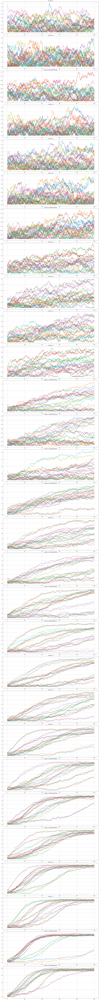

In [26]:
# PRINT THE OVERLAP IN FUNCTION OF THE STEP
print(len(res_2vals))
beta_val=24 #INDEX IN THE LIST_VAL2

fig, axs = plt.subplots(len(list_value_), figsize=(20,200), facecolor='white')
fig.tight_layout()
for i in range(len(list_value_)):
    axs[i].grid()
    axs[i].set_title(f"lambda={list_value_[i]}")
    for run_in_on_sample in range(size_of_one_sample):
        axs[i].plot(res_2vals[beta_val][0][i][run_in_on_sample])

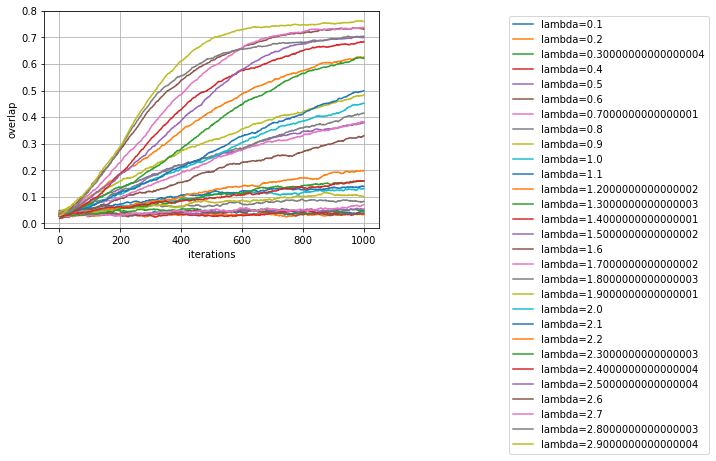

In [27]:
# PRINT THE OVERLAP IN FUNCTION OF THE STEP
iteration_mean_u_v=res_2vals[beta_val][0].mean(axis=1).mean(axis=2)
overlap_mean_u_v = res_2vals[beta_val][1].mean(axis=1).mean(axis=1)

plt.figure(facecolor='white')
plt.grid()
plt.ylabel("overlap")
plt.xlabel("iterations")

for i in range(len(list_value_)):
    plt.plot(iteration_mean_u_v[i], label=f"lambda={list_value_[i]}")
plt.legend(loc='upper right', bbox_to_anchor=(2, 1))

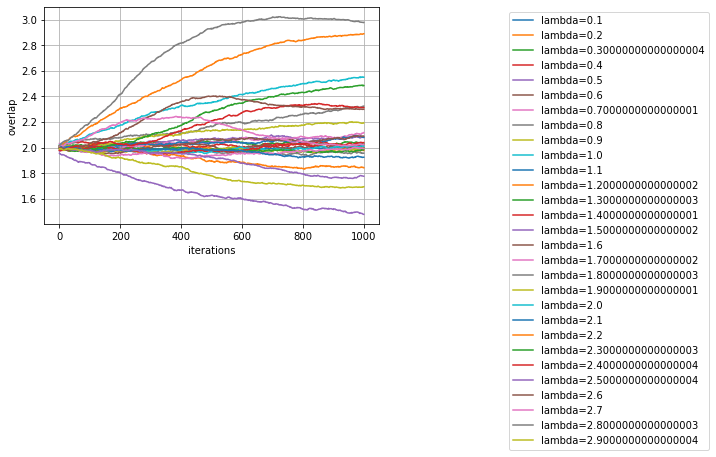

In [29]:
# PRINT THE OVERLAP IN FUNCTION OF THE STEP
iteration_mse_u_v=res_2vals[beta_val][2].mean(axis=1).mean(axis=2)

plt.figure(facecolor='white')
plt.grid()
plt.ylabel("overlap")
plt.xlabel("iterations")

for i in range(len(list_value_)):
    plt.plot(iteration_mse_u_v[i], label=f"lambda={list_value_[i]}")
plt.legend(loc='upper right', bbox_to_anchor=(2, 1))

[0.04386017 0.03040913 0.03340813 0.03318687 0.03463243 0.04015943
 0.04594226 0.05400354 0.03636218 0.03576357 0.0425181  0.04422428
 0.04753231 0.04085188 0.06206544 0.06202548 0.0753192  0.07891501
 0.08388865 0.11429962 0.14630216 0.12301702 0.2341654  0.19959837
 0.26375222 0.30067298 0.35964665 0.37668383 0.40940666]
[0.03591235 0.03266712 0.03676967 0.02618128 0.03470886 0.0373832
 0.04136541 0.04302403 0.0512113  0.0375275  0.05414098 0.03841818
 0.05777223 0.04712274 0.05585064 0.1006773  0.10129689 0.11492601
 0.09847407 0.13676822 0.19614643 0.25128025 0.3234925  0.3376001
 0.41555852 0.38712418 0.43887454 0.48601764 0.51746905]
[0.0400448  0.0479215  0.03452748 0.02774409 0.0339678  0.05081135
 0.03853983 0.03959762 0.05616233 0.05386917 0.06801359 0.09166309
 0.05742506 0.10870741 0.10831003 0.09208426 0.13290541 0.1388197
 0.17243335 0.28336966 0.3317336  0.3251278  0.43320638 0.39023185
 0.45651922 0.48838186 0.48780286 0.5277095  0.51462543]
[0.02298814 0.03486671 0.039

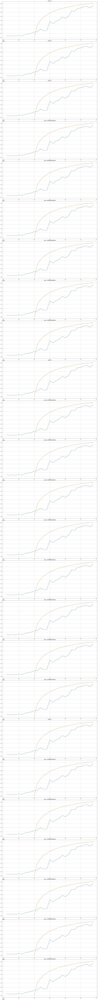

In [53]:
# BLUE LINE = OVERLAP
# ORANGE LINE = (1-(1/X))**0.5
# GREEN LINE = MSE
mse_mean_u_v = mse_mean.mean(axis=1).mean(axis=1)

fig, axs = plt.subplots(len(list_value2), figsize=(20,200), facecolor='white')
fig.tight_layout()
for i in range(len(list_value2)):
    mse_mean_uv = res_2vals[i][3].mean(axis=1).mean(axis=1)
    overlap_mean_uv = res_2vals[i][1].mean(axis=1).mean(axis=1)
    print(overlap_mean_uv)
    axs[i].grid()
    axs[i].set_title(f"beta={list_value2[i]}")
    axs[i].set_xlabel("lambda",loc='left')
    axs[i].plot(list_value_, overlap_mean_u_v, marker="", 
         linestyle ="solid", label="overlap")
    #axs[i].plot(list_value_, mse_mean_u_v, marker="", linestyle ="solid", label="mse")
    
    lambda_greater_than_1 = np.array([])
    for x in list_value_:
        if x>=1:
            lambda_greater_than_1=np.append(lambda_greater_than_1,x)
    axs[i].plot(lambda_greater_than_1, (1-(1/lambda_greater_than_1))**0.5, linestyle="solid",
             marker="", label="(1-(1/X))**0.5")

[0.04776303 0.03283315 0.04521517 0.03544368 0.05380869 0.03816409
 0.07062525 0.08232465 0.10056713 0.13064715 0.1386339  0.19761029
 0.15862593 0.15991223 0.37904698 0.3300031  0.38209355 0.4151937
 0.484696   0.45222962 0.499596   0.6265166  0.6214299  0.6841957
 0.69991684 0.7315052  0.73660886 0.7043675  0.7597768 ]
